# EDA - Análisis Exploratorio de los Satellite Embeddings

Ahora que tenemos el archivo TIFF descargado, vamos a realizar un análisis exploratorio completo para entender:

1. **Estructura de los datos**: dimensiones, bandas, tipos de datos
2. **Distribución estadística**: histogramas, estadísticas descriptivas por banda
3. **Análisis espacial**: patrones geográficos, correlaciones espaciales
4. **Visualización**: mapas de las diferentes dimensiones de embeddings
5. **Análisis de componentes principales**: reducción de dimensionalidad
6. **Detección de outliers**: valores anómalos en el espacio de embeddings

Este análisis nos ayudará a entender qué información capturan los embeddings y cómo usarlos para análisis posteriores.

In [1]:
# Importar librerías para EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


# Configurar estilo de visualización
plt.style.use('default')
sns.set_palette("husl")

print("Librerías para EDA importadas correctamente")

Librerías para EDA importadas correctamente


In [2]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

tiff_path = "quito_satellite_embeddings_test.tif"

# Abrir el GeoTIFF
with rasterio.open(tiff_path) as src:
    print("✅ Archivo abierto correctamente")
    print(f"Bandas: {src.count}")
    print(f"Dimensiones: {src.width} x {src.height}")
    print(f"Tipo de datos: {src.dtypes}")
    print(f"CRS (sistema de referencia): {src.crs}")

    # Leer todas las bandas (como array 3D)
    embeddings_data = src.read()  # (bandas, filas, columnas)

print("Forma del array:", embeddings_data.shape)


✅ Archivo abierto correctamente
Bandas: 64
Dimensiones: 2228 x 2227
Tipo de datos: ('float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64', 'float64')
CRS (sistema de referencia): EPSG:4326
Forma del array: (64, 2227, 2228)
Forma del array: (64, 2227, 2228)


In [3]:
# 1. CARGAR Y EXPLORAR LA ESTRUCTURA DE LOS DATOS

# Importar rasterio para cargar TIFF geoespaciales
import rasterio
import numpy as np

# Ruta al archivo TIFF
tiff_path = 'quito_satellite_embeddings_test.tif'

def load_tiff_data(file_path):
    """Cargar datos TIFF usando rasterio (óptimo para archivos geoespaciales)"""
    
    print("=== CARGANDO TIFF CON RASTERIO ===")
    print(f"Archivo: {file_path}")
    
    try:
        # Abrir dataset con rasterio
        with rasterio.open(file_path) as src:
            print("=== INFORMACIÓN BÁSICA DEL ARCHIVO ===")
            print(f"Dimensiones: {src.width} x {src.height} píxeles")
            print(f"Número de bandas: {src.count}")
            print(f"Tipo de datos: {src.dtypes[0]}")
            print(f"Sistema de coordenadas: {src.crs}")
            print(f"Resolución: {src.res} metros por píxel")
            
            # Bounds geográficos
            bounds = src.bounds
            print(f"\n=== BOUNDS GEOGRÁFICOS ===")
            print(f"Oeste: {bounds.left:.6f}")
            print(f"Este: {bounds.right:.6f}")
            print(f"Sur: {bounds.bottom:.6f}")
            print(f"Norte: {bounds.top:.6f}")
            
            # Cargar todos los datos
            print(f"\n=== CARGANDO DATOS ===")
            data = src.read()  # Shape: (bands, height, width)
            
            print(f"Forma del array: {data.shape}")
            print(f"Tipo de datos: {data.dtype}")
            print(f"Rango de valores: [{data.min():.4f}, {data.max():.4f}]")
            
            metadata = {
                'width': src.width,
                'height': src.height,
                'count': src.count,
                'dtype': str(src.dtypes[0]),
                'crs': str(src.crs),
                'bounds': bounds,
                'transform': src.transform,
                'resolution': src.res
            }
            
            return data, metadata
            
    except FileNotFoundError:
        print(f"❌ Archivo no encontrado: {file_path}")
        print("💡 Asegúrate de que el archivo TIFF esté en el directorio actual")
        raise
        
    except Exception as e:
        print(f"❌ Error cargando TIFF con rasterio: {e}")
        print("💡 Verifica que rasterio esté instalado: pip install rasterio")
        print("💡 Asegúrate de que el archivo sea un TIFF válido")
        raise e

# Cargar los datos
try:
    embeddings_data, metadata = load_tiff_data(tiff_path)
    
    print(f"✅ Datos cargados exitosamente")
    print(f"Forma de los datos: {embeddings_data.shape}")
    print(f"Tamaño en memoria: {embeddings_data.nbytes / 1024 / 1024:.2f} MB")
    print(f"Tipo de datos: {embeddings_data.dtype}")
    
    # Verificar si hay valores NaN o NoData
    nan_count = np.isnan(embeddings_data).sum()
    if nan_count > 0:
        print(f"⚠️ Valores NaN encontrados: {nan_count:,}")
    else:
        print("✅ No hay valores NaN en los datos")
        
except FileNotFoundError:
    print(f"❌ Archivo no encontrado: {tiff_path}")
    print("📋 Asegúrate de que el archivo TIFF esté en el directorio actual")
    print("💡 Lista de archivos disponibles:")
    import os
    for file in os.listdir('.'):
        if file.endswith('.tif') or file.endswith('.tiff'):
            print(f"   - {file}")
            
except Exception as e:
    print(f"❌ Error cargando datos: {e}")
    raise e

=== CARGANDO TIFF CON RASTERIO ===
Archivo: quito_satellite_embeddings_test.tif
=== INFORMACIÓN BÁSICA DEL ARCHIVO ===
Dimensiones: 2228 x 2227 píxeles
Número de bandas: 64
Tipo de datos: float64
Sistema de coordenadas: EPSG:4326
Resolución: (8.983152841195215e-05, 8.983152841195215e-05) metros por píxel

=== BOUNDS GEOGRÁFICOS ===
Oeste: -78.600072
Este: -78.399927
Sur: -0.300037
Norte: -0.099982

=== CARGANDO DATOS ===
Forma del array: (64, 2227, 2228)
Tipo de datos: float64
Rango de valores: [-0.5552, 0.5094]
Forma del array: (64, 2227, 2228)
Tipo de datos: float64
Rango de valores: [-0.5552, 0.5094]
✅ Datos cargados exitosamente
Forma de los datos: (64, 2227, 2228)
Tamaño en memoria: 2422.73 MB
Tipo de datos: float64
✅ Datos cargados exitosamente
Forma de los datos: (64, 2227, 2228)
Tamaño en memoria: 2422.73 MB
Tipo de datos: float64
✅ No hay valores NaN en los datos
✅ No hay valores NaN en los datos


In [4]:
# 2. ANÁLISIS ESTADÍSTICO BÁSICO

print("=== ESTADÍSTICAS DESCRIPTIVAS ===")

# Calcular estadísticas para cada banda
stats_data = []
for band_idx in range(embeddings_data.shape[0]):
    band_data = embeddings_data[band_idx].flatten()
    
    # Remover valores NoData si existen
    valid_data = band_data[~np.isnan(band_data)]
    
    if len(valid_data) > 0:
        stats_data.append({
            'banda': f'A{band_idx:02d}',
            'min': np.min(valid_data),
            'max': np.max(valid_data),
            'mean': np.mean(valid_data),
            'std': np.std(valid_data),
            'median': np.median(valid_data),
            'q25': np.percentile(valid_data, 25),
            'q75': np.percentile(valid_data, 75),
            'pixels_validos': len(valid_data),
            'pixels_total': len(band_data)
        })

# Crear DataFrame con estadísticas
stats_df = pd.DataFrame(stats_data)

print(f"Resumen estadístico de las primeras 10 bandas:")
print(stats_df.head(10).round(4))

print(f"\n=== ESTADÍSTICAS GENERALES ===")
print(f"Rango de valores mínimos: {stats_df['min'].min():.4f} - {stats_df['min'].max():.4f}")
print(f"Rango de valores máximos: {stats_df['max'].min():.4f} - {stats_df['max'].max():.4f}")
print(f"Media global: {stats_df['mean'].mean():.4f}")
print(f"Desviación estándar promedio: {stats_df['std'].mean():.4f}")
print(f"Coeficiente de variación promedio: {(stats_df['std'] / stats_df['mean']).mean():.4f}")

=== ESTADÍSTICAS DESCRIPTIVAS ===
Resumen estadístico de las primeras 10 bandas:
  banda     min     max    mean     std  median     q25     q75  \
0   A00 -0.1663  0.2680  0.0367  0.0609  0.0354 -0.0089  0.0797   
1   A01 -0.4036  0.1794 -0.0960  0.0765 -0.0984 -0.1538 -0.0384   
2   A02 -0.2761  0.3101 -0.0283  0.0664 -0.0298 -0.0754  0.0178   
3   A03 -0.2680  0.1929 -0.0265  0.0580 -0.0271 -0.0670  0.0138   
4   A04 -0.2289  0.3553  0.0680  0.0805  0.0797  0.0246  0.1191   
5   A05 -0.3278  0.2215 -0.0355  0.0760 -0.0325 -0.0888  0.0222   
6   A06 -0.2365  0.3189  0.0294  0.0747  0.0298 -0.0199  0.0754   
7   A07 -0.3189  0.2442 -0.0826  0.0857 -0.0842 -0.1477 -0.0222   
8   A08 -0.3460  0.2929 -0.0068  0.1217  0.0121 -0.1085  0.0936   
9   A09 -0.2599  0.2520  0.0147  0.0715  0.0178 -0.0354  0.0670   

   pixels_validos  pixels_total  
0         4961756       4961756  
1         4961756       4961756  
2         4961756       4961756  
3         4961756       4961756  
4         4

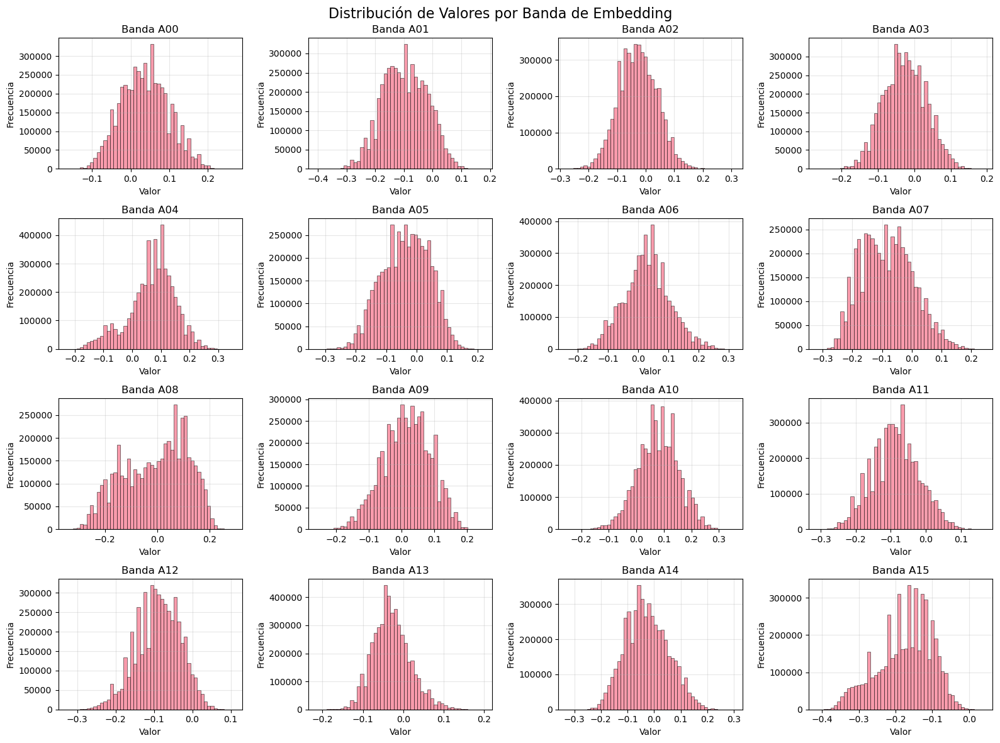

/tmp/ipykernel_5186/60383098.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(band_data_list, labels=band_names)


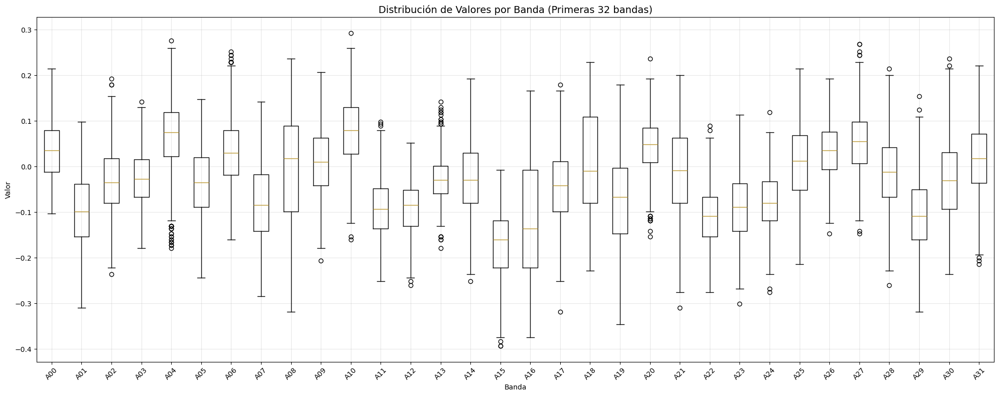

In [5]:
# 3. VISUALIZACIÓN DE DISTRIBUCIONES

# Crear subplot con histogramas de las primeras 16 bandas
fig, axes = plt.subplots(4, 4, figsize=(16, 12))
fig.suptitle('Distribución de Valores por Banda de Embedding', fontsize=16, y=0.98)

for i in range(16):
    row = i // 4
    col = i % 4
    
    if i < embeddings_data.shape[0]:
        band_data = embeddings_data[i].flatten()
        valid_data = band_data[~np.isnan(band_data)]
        
        axes[row, col].hist(valid_data, bins=50, alpha=0.7, edgecolor='black', linewidth=0.5)
        axes[row, col].set_title(f'Banda A{i:02d}')
        axes[row, col].set_xlabel('Valor')
        axes[row, col].set_ylabel('Frecuencia')
        axes[row, col].grid(True, alpha=0.3)
    else:
        axes[row, col].axis('off')

plt.tight_layout()
plt.show()

# Box plot de todas las bandas
plt.figure(figsize=(20, 8))
band_data_list = []
band_names = []

for i in range(min(32, embeddings_data.shape[0])):  # Primeras 32 bandas
    band_data = embeddings_data[i].flatten()
    valid_data = band_data[~np.isnan(band_data)]
    if len(valid_data) > 0:
        # Samplear datos para visualización más rápida
        sample_size = min(1000, len(valid_data))
        sampled_data = np.random.choice(valid_data, sample_size, replace=False)
        band_data_list.append(sampled_data)
        band_names.append(f'A{i:02d}')

plt.boxplot(band_data_list, labels=band_names)
plt.title('Distribución de Valores por Banda (Primeras 32 bandas)', fontsize=14)
plt.xlabel('Banda')
plt.ylabel('Valor')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

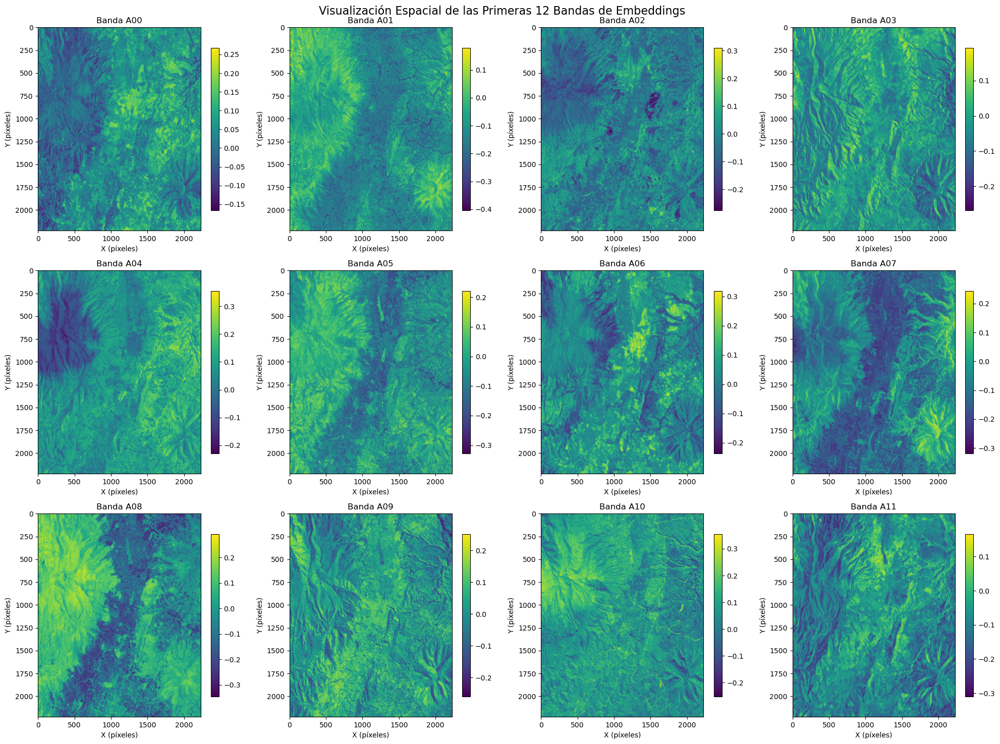

=== ANÁLISIS DE CORRELACIONES ===


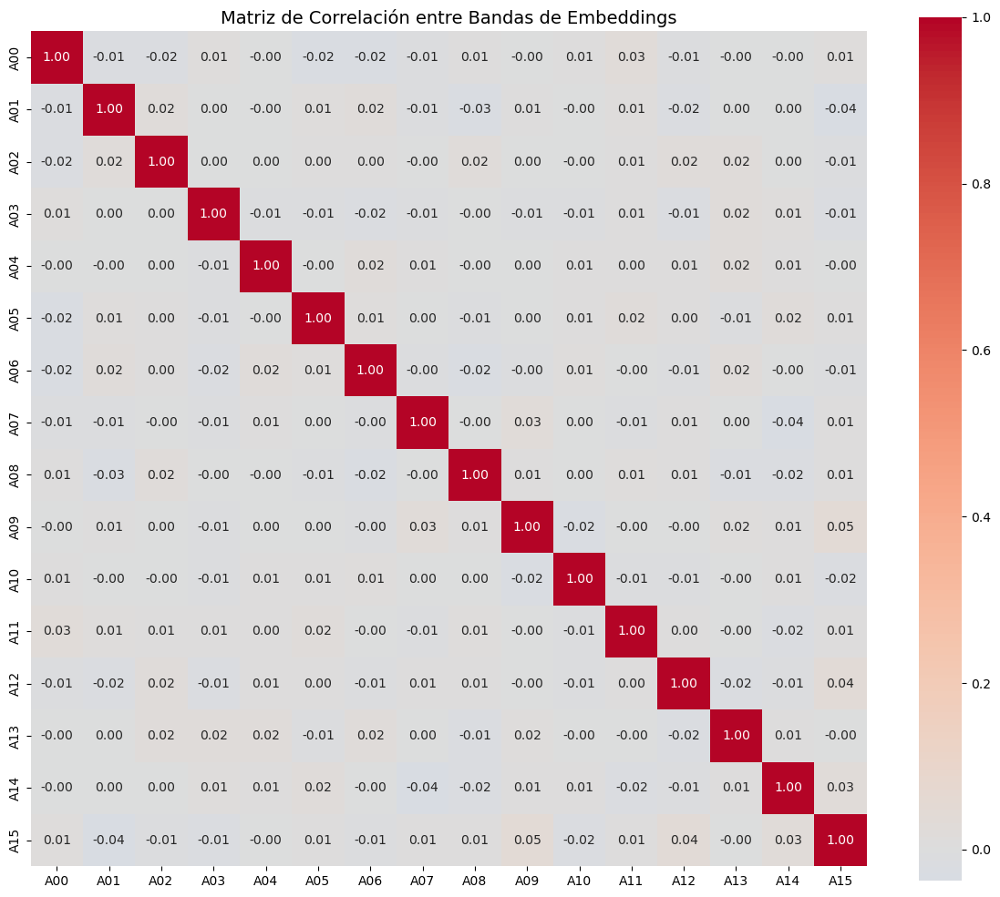

Correlación promedio entre bandas: 0.0009
Correlación máxima: 0.0460
Correlación mínima: -0.0370


In [7]:
# 4. VISUALIZACIÓN ESPACIAL DE LAS PRIMERAS BANDAS

# Visualizar las primeras 12 bandas espacialmente
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle('Visualización Espacial de las Primeras 12 Bandas de Embeddings', fontsize=16, y=0.98)

for i in range(12):
    row = i // 4
    col = i % 4
    
    if i < embeddings_data.shape[0]:
        band_image = embeddings_data[i]
        
        # Crear el mapa
        im = axes[row, col].imshow(band_image, cmap='viridis', aspect='auto')
        axes[row, col].set_title(f'Banda A{i:02d}')
        axes[row, col].set_xlabel('X (píxeles)')
        axes[row, col].set_ylabel('Y (píxeles)')
        
        # Agregar colorbar
        plt.colorbar(im, ax=axes[row, col], shrink=0.8)
    else:
        axes[row, col].axis('off')

plt.tight_layout()
plt.show()

# Mapa de calor de correlaciones entre las primeras 16 bandas
print("=== ANÁLISIS DE CORRELACIONES ===")

# Preparar datos para correlación
correlation_data = []
for i in range(min(16, embeddings_data.shape[0])):
    band_data = embeddings_data[i].flatten()
    valid_data = band_data[~np.isnan(band_data)]
    # Samplear para acelerar el cálculo
    sample_size = min(5000, len(valid_data))
    if len(valid_data) >= sample_size:
        sampled_data = np.random.choice(valid_data, sample_size, replace=False)
        correlation_data.append(sampled_data)

if len(correlation_data) > 1:
    correlation_matrix = np.corrcoef(correlation_data)
    
    plt.figure(figsize=(12, 10))
    band_labels = [f'A{i:02d}' for i in range(len(correlation_data))]
    
    sns.heatmap(correlation_matrix, 
                annot=True, 
                fmt='.2f', 
                cmap='coolwarm', 
                center=0,
                xticklabels=band_labels,
                yticklabels=band_labels,
                square=True)
    
    plt.title('Matriz de Correlación entre Bandas de Embeddings', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    print(f"Correlación promedio entre bandas: {np.mean(correlation_matrix[np.triu_indices_from(correlation_matrix, k=1)]):.4f}")
    print(f"Correlación máxima: {np.max(correlation_matrix[np.triu_indices_from(correlation_matrix, k=1)]):.4f}")
    print(f"Correlación mínima: {np.min(correlation_matrix[np.triu_indices_from(correlation_matrix, k=1)]):.4f}")

=== ANÁLISIS DE COMPONENTES PRINCIPALES ===
Total de píxeles: 4961756
Píxeles válidos: 4961756
Dimensiones de embeddings: 64
Total de píxeles: 4961756
Píxeles válidos: 4961756
Dimensiones de embeddings: 64


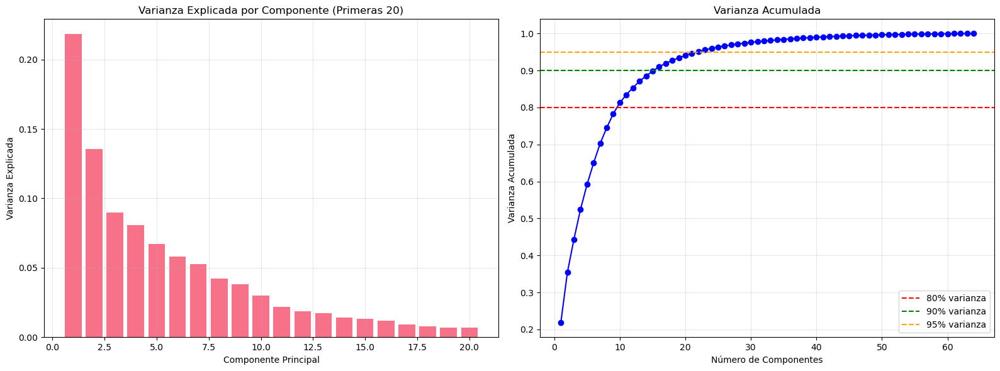


Componentes necesarios para explicar:
  80% de la varianza: 10
  90% de la varianza: 16
  95% de la varianza: 22

Primeras 5 componentes explican: 0.592 de la varianza
Primeras 10 componentes explican: 0.813 de la varianza


In [8]:
# 5. ANÁLISIS DE COMPONENTES PRINCIPALES (PCA)

print("=== ANÁLISIS DE COMPONENTES PRINCIPALES ===")

# Preparar datos para PCA
# Reshape datos: (n_samples, n_features) donde n_samples = height*width, n_features = n_bands
height, width, n_bands = embeddings_data.shape[1], embeddings_data.shape[2], embeddings_data.shape[0]
reshaped_data = embeddings_data.reshape(n_bands, -1).T  # (height*width, n_bands)

# Remover píxeles con valores NaN
valid_mask = ~np.isnan(reshaped_data).any(axis=1)
clean_data = reshaped_data[valid_mask]

print(f"Total de píxeles: {reshaped_data.shape[0]}")
print(f"Píxeles válidos: {clean_data.shape[0]}")
print(f"Dimensiones de embeddings: {clean_data.shape[1]}")

# Estandarizar los datos
scaler = StandardScaler()
scaled_data = scaler.fit_transform(clean_data)

# Aplicar PCA
pca = PCA()
pca_data = pca.fit_transform(scaled_data)

# Análisis de varianza explicada
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Visualizar varianza explicada
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Varianza explicada por componente
ax1.bar(range(1, min(21, len(pca.explained_variance_ratio_) + 1)), 
        pca.explained_variance_ratio_[:20])
ax1.set_xlabel('Componente Principal')
ax1.set_ylabel('Varianza Explicada')
ax1.set_title('Varianza Explicada por Componente (Primeras 20)')
ax1.grid(True, alpha=0.3)

# Varianza acumulada
ax2.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
ax2.axhline(y=0.8, color='r', linestyle='--', label='80% varianza')
ax2.axhline(y=0.9, color='g', linestyle='--', label='90% varianza')
ax2.axhline(y=0.95, color='orange', linestyle='--', label='95% varianza')
ax2.set_xlabel('Número de Componentes')
ax2.set_ylabel('Varianza Acumulada')
ax2.set_title('Varianza Acumulada')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Información de componentes principales
n_components_80 = np.argmax(cumulative_variance >= 0.8) + 1
n_components_90 = np.argmax(cumulative_variance >= 0.9) + 1
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1

print(f"\nComponentes necesarios para explicar:")
print(f"  80% de la varianza: {n_components_80}")
print(f"  90% de la varianza: {n_components_90}")
print(f"  95% de la varianza: {n_components_95}")

print(f"\nPrimeras 5 componentes explican: {cumulative_variance[4]:.3f} de la varianza")
print(f"Primeras 10 componentes explican: {cumulative_variance[9]:.3f} de la varianza")

=== VISUALIZACIÓN DE COMPONENTES PRINCIPALES ===


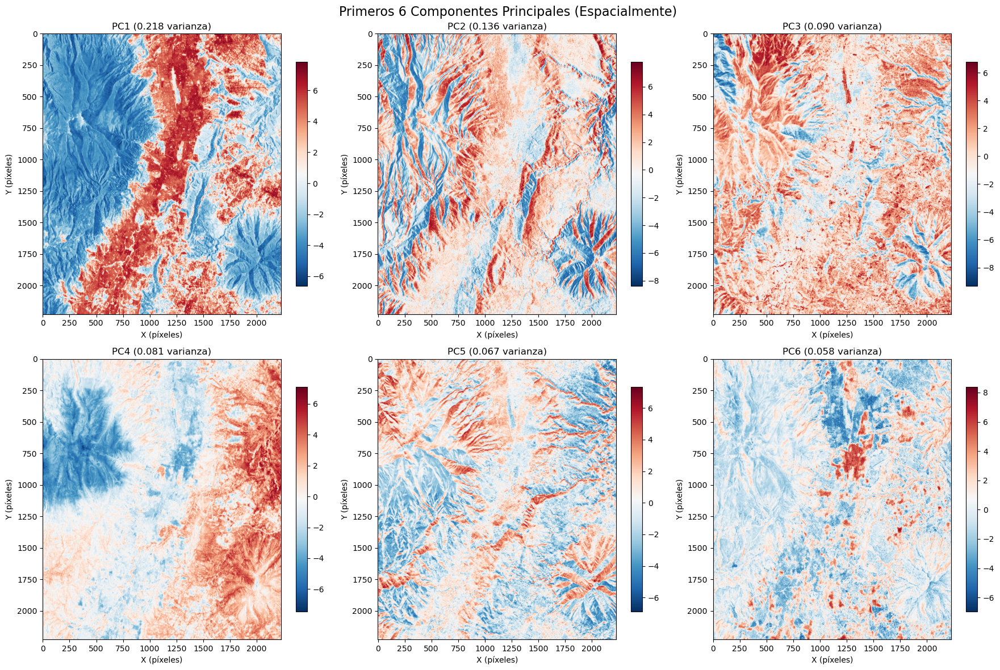


=== CONTRIBUCIÓN DE BANDAS A COMPONENTES PRINCIPALES ===


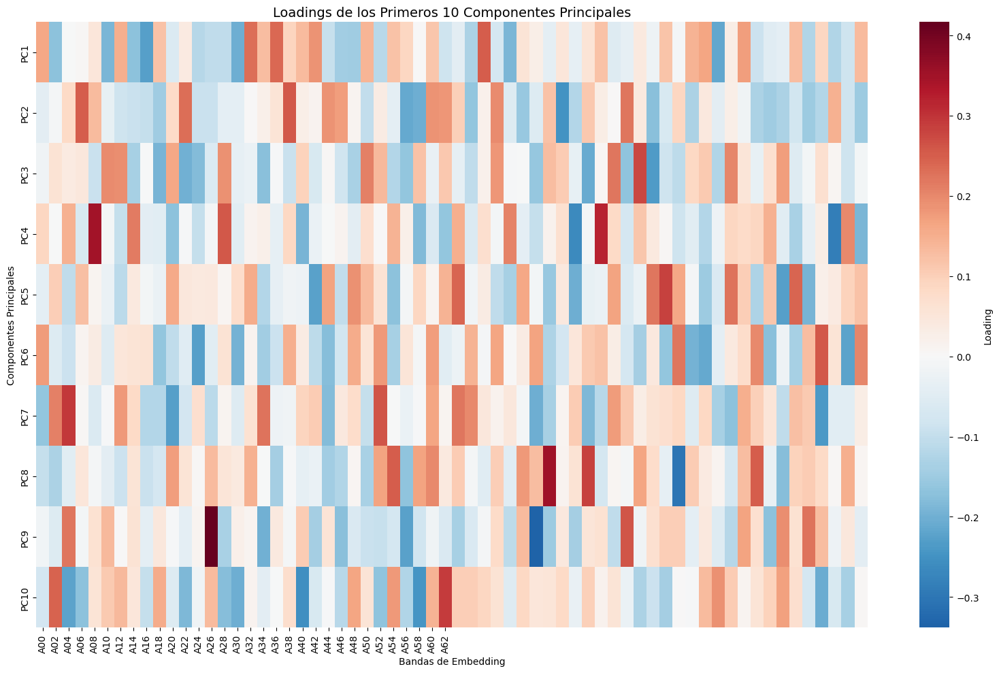


PC1 - Top 5 bandas más importantes:
  1. Banda A34: loading = 0.2503
  2. Banda A18: loading = 0.2381
  3. Banda A16: loading = 0.2325
  4. Banda A08: loading = -0.2282
  5. Banda A52: loading = -0.2159

PC2 - Top 5 bandas más importantes:
  1. Banda A19: loading = 0.2586
  2. Banda A03: loading = 0.2500
  3. Banda A40: loading = -0.2497
  4. Banda A11: loading = 0.2332
  5. Banda A45: loading = 0.2229

PC3 - Top 5 bandas más importantes:
  1. Banda A46: loading = 0.2767
  2. Banda A47: loading = -0.2343
  3. Banda A44: loading = 0.2246
  4. Banda A42: loading = -0.2103
  5. Banda A25: loading = 0.2083


In [9]:
# 6. VISUALIZACIÓN ESPACIAL DE COMPONENTES PRINCIPALES

# Reconstruir la forma espacial de los primeros componentes principales
print("=== VISUALIZACIÓN DE COMPONENTES PRINCIPALES ===")

# Crear máscaras espaciales para reconstruir las imágenes
spatial_mask = valid_mask.reshape(height, width)

# Visualizar los primeros 6 componentes principales
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Primeros 6 Componentes Principales (Espacialmente)', fontsize=16)

for i in range(6):
    row = i // 3
    col = i % 3
    
    # Crear imagen vacía
    pc_image = np.full((height, width), np.nan)
    
    # Llenar con los valores del componente principal
    pc_image[spatial_mask] = pca_data[:, i]
    
    # Visualizar
    im = axes[row, col].imshow(pc_image, cmap='RdBu_r', aspect='auto')
    axes[row, col].set_title(f'PC{i+1} ({pca.explained_variance_ratio_[i]:.3f} varianza)')
    axes[row, col].set_xlabel('X (píxeles)')
    axes[row, col].set_ylabel('Y (píxeles)')
    
    # Colorbar
    plt.colorbar(im, ax=axes[row, col], shrink=0.8)

plt.tight_layout()
plt.show()

# Análisis de la contribución de cada banda original a los primeros PCs
print("\n=== CONTRIBUCIÓN DE BANDAS A COMPONENTES PRINCIPALES ===")

# Matriz de loadings (componentes)
loadings = pca.components_[:10]  # Primeros 10 PCs

# Visualizar loadings
plt.figure(figsize=(16, 10))
band_names = [f'A{i:02d}' for i in range(embeddings_data.shape[0])]

sns.heatmap(loadings, 
            cmap='RdBu_r', 
            center=0,
            yticklabels=[f'PC{i+1}' for i in range(10)],
            xticklabels=band_names if len(band_names) <= 32 else [f'A{i:02d}' for i in range(0, len(band_names), 2)],
            cbar_kws={'label': 'Loading'})

plt.title('Loadings de los Primeros 10 Componentes Principales', fontsize=14)
plt.xlabel('Bandas de Embedding')
plt.ylabel('Componentes Principales')
plt.tight_layout()
plt.show()

# Mostrar las bandas más importantes para los primeros 3 PCs
for pc_idx in range(3):
    loadings_abs = np.abs(loadings[pc_idx])
    top_bands_idx = np.argsort(loadings_abs)[-5:][::-1]
    
    print(f"\nPC{pc_idx+1} - Top 5 bandas más importantes:")
    for i, band_idx in enumerate(top_bands_idx):
        print(f"  {i+1}. Banda A{band_idx:02d}: loading = {loadings[pc_idx, band_idx]:.4f}")

=== DETECCIÓN DE OUTLIERS ===
Outliers por banda (Z-score > 3):
   banda  outliers_count  total_pixels  outliers_percentage
0    A00            1781       4961756             0.035895
1    A01            3351       4961756             0.067537
2    A02           14202       4961756             0.286229
3    A03            5264       4961756             0.106091
4    A04            3677       4961756             0.074107
5    A05            2217       4961756             0.044682
6    A06            6250       4961756             0.125963
7    A07            3338       4961756             0.067275
8    A08               0       4961756             0.000000
9    A09            3832       4961756             0.077231
10   A10           10990       4961756             0.221494
11   A11            3281       4961756             0.066126
12   A12            4159       4961756             0.083821
13   A13           27428       4961756             0.552788
14   A14            4424       49617

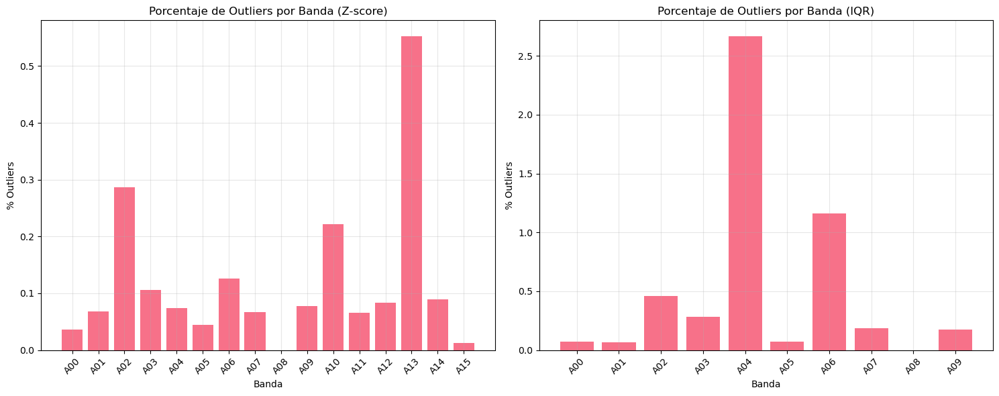

In [10]:
# 7. DETECCIÓN DE OUTLIERS Y ANÁLISIS DE VALORES EXTREMOS

print("=== DETECCIÓN DE OUTLIERS ===")

# Método 1: Z-score para cada banda
outliers_zscore = []
z_threshold = 3

for i in range(min(16, embeddings_data.shape[0])):  # Analizar primeras 16 bandas
    band_data = embeddings_data[i].flatten()
    valid_data = band_data[~np.isnan(band_data)]
    
    if len(valid_data) > 0:
        z_scores = np.abs(stats.zscore(valid_data))
        outliers_count = np.sum(z_scores > z_threshold)
        outliers_percentage = (outliers_count / len(valid_data)) * 100
        
        outliers_zscore.append({
            'banda': f'A{i:02d}',
            'outliers_count': outliers_count,
            'total_pixels': len(valid_data),
            'outliers_percentage': outliers_percentage
        })

outliers_df = pd.DataFrame(outliers_zscore)
print("Outliers por banda (Z-score > 3):")
print(outliers_df)

# Método 2: IQR (Interquartile Range)
print(f"\n=== ANÁLISIS IQR ===")
iqr_outliers = []

for i in range(min(16, embeddings_data.shape[0])):
    band_data = embeddings_data[i].flatten()
    valid_data = band_data[~np.isnan(band_data)]
    
    if len(valid_data) > 0:
        q1 = np.percentile(valid_data, 25)
        q3 = np.percentile(valid_data, 75)
        iqr = q3 - q1
        
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        outliers_mask = (valid_data < lower_bound) | (valid_data > upper_bound)
        outliers_count = np.sum(outliers_mask)
        outliers_percentage = (outliers_count / len(valid_data)) * 100
        
        iqr_outliers.append({
            'banda': f'A{i:02d}',
            'q1': q1,
            'q3': q3,
            'iqr': iqr,
            'lower_bound': lower_bound,
            'upper_bound': upper_bound,
            'outliers_count': outliers_count,
            'outliers_percentage': outliers_percentage
        })

iqr_df = pd.DataFrame(iqr_outliers)
print("Estadísticas IQR por banda:")
print(iqr_df[['banda', 'outliers_count', 'outliers_percentage']].head(10))

# Visualizar distribución de outliers
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.bar(outliers_df['banda'], outliers_df['outliers_percentage'])
plt.title('Porcentaje de Outliers por Banda (Z-score)')
plt.xlabel('Banda')
plt.ylabel('% Outliers')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.bar(iqr_df['banda'][:10], iqr_df['outliers_percentage'][:10])
plt.title('Porcentaje de Outliers por Banda (IQR)')
plt.xlabel('Banda')
plt.ylabel('% Outliers')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

=== ANÁLISIS DE CLUSTERING ===
Determinando número óptimo de clusters...
Probando k=2...
Probando k=2...
Probando k=3...
Probando k=3...
Probando k=4...
Probando k=4...
Probando k=5...
Probando k=5...
Probando k=6...
Probando k=6...
Probando k=7...
Probando k=7...
Probando k=8...
Probando k=8...
Probando k=9...
Probando k=9...
Probando k=10...
Probando k=10...


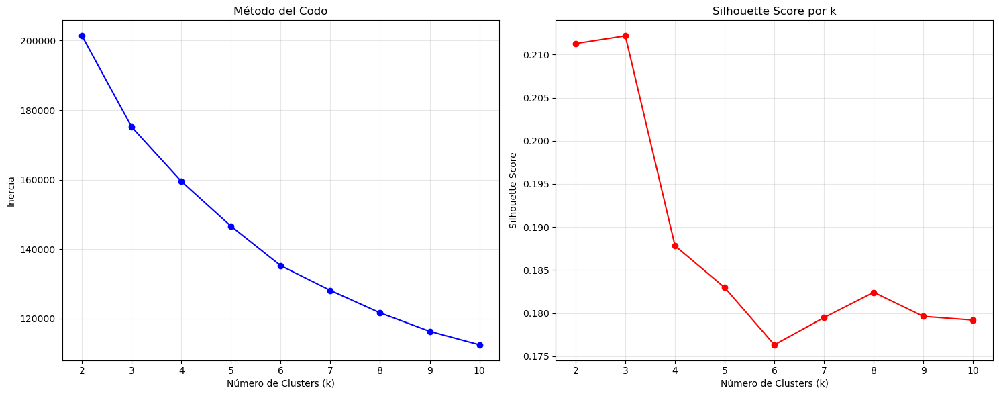


Número óptimo de clusters: 3
Silhouette score: 0.212

Distribución de clusters:
  Cluster 0: 2004435 píxeles (40.4%)
  Cluster 1: 1382324 píxeles (27.9%)
  Cluster 2: 1574997 píxeles (31.7%)

Distribución de clusters:
  Cluster 0: 2004435 píxeles (40.4%)
  Cluster 1: 1382324 píxeles (27.9%)
  Cluster 2: 1574997 píxeles (31.7%)


In [11]:
# 8. ANÁLISIS DE CLUSTERING EN EL ESPACIO DE EMBEDDINGS

print("=== ANÁLISIS DE CLUSTERING ===")

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Usar PCA reducido para clustering (más eficiente)
n_components_clustering = min(10, pca_data.shape[1])
pca_reduced = pca_data[:, :n_components_clustering]

# Determinar número óptimo de clusters usando el método del codo
print("Determinando número óptimo de clusters...")

# Samplear datos para acelerar el análisis
sample_size = min(5000, pca_reduced.shape[0])
sample_indices = np.random.choice(pca_reduced.shape[0], sample_size, replace=False)
sample_data = pca_reduced[sample_indices]

k_range = range(2, 11)
inertias = []
silhouette_scores = []

for k in k_range:
    print(f"Probando k={k}...")
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(sample_data)
    
    inertias.append(kmeans.inertia_)
    sil_score = silhouette_score(sample_data, cluster_labels)
    silhouette_scores.append(sil_score)

# Visualizar métricas de clustering
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Método del codo
ax1.plot(k_range, inertias, 'bo-')
ax1.set_xlabel('Número de Clusters (k)')
ax1.set_ylabel('Inercia')
ax1.set_title('Método del Codo')
ax1.grid(True, alpha=0.3)

# Silhouette score
ax2.plot(k_range, silhouette_scores, 'ro-')
ax2.set_xlabel('Número de Clusters (k)')
ax2.set_ylabel('Silhouette Score')
ax2.set_title('Silhouette Score por k')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Seleccionar k óptimo (máximo silhouette score)
optimal_k = k_range[np.argmax(silhouette_scores)]
print(f"\nNúmero óptimo de clusters: {optimal_k}")
print(f"Silhouette score: {max(silhouette_scores):.3f}")

# Aplicar clustering con k óptimo
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
all_clusters = kmeans_final.fit_predict(pca_reduced)

print(f"\nDistribución de clusters:")
unique, counts = np.unique(all_clusters, return_counts=True)
for cluster_id, count in zip(unique, counts):
    percentage = (count / len(all_clusters)) * 100
    print(f"  Cluster {cluster_id}: {count} píxeles ({percentage:.1f}%)")

=== VISUALIZACIÓN ESPACIAL DE CLUSTERS ===


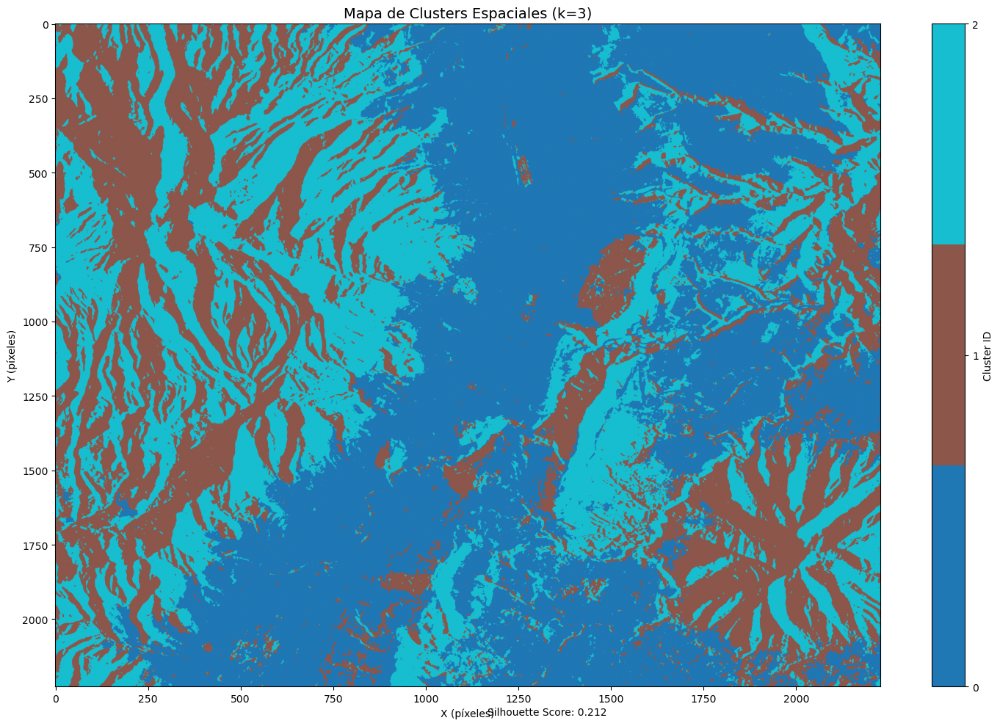


=== CARACTERÍSTICAS DE CADA CLUSTER ===
   cluster_id  n_pixels  pc1_mean  pc2_mean  pc1_std  pc2_std  \
0           0   2004435    4.0684    0.3815   1.6414   1.6881   
1           1   1382324   -2.2421   -3.4964   1.5104   1.8054   
2           2   1574997   -3.2098    2.5832   1.6678   1.8140   

   mean_embedding_norm  
0               0.8751  
1               0.8368  
2               0.8601  
   cluster_id  n_pixels  pc1_mean  pc2_mean  pc1_std  pc2_std  \
0           0   2004435    4.0684    0.3815   1.6414   1.6881   
1           1   1382324   -2.2421   -3.4964   1.5104   1.8054   
2           2   1574997   -3.2098    2.5832   1.6678   1.8140   

   mean_embedding_norm  
0               0.8751  
1               0.8368  
2               0.8601  


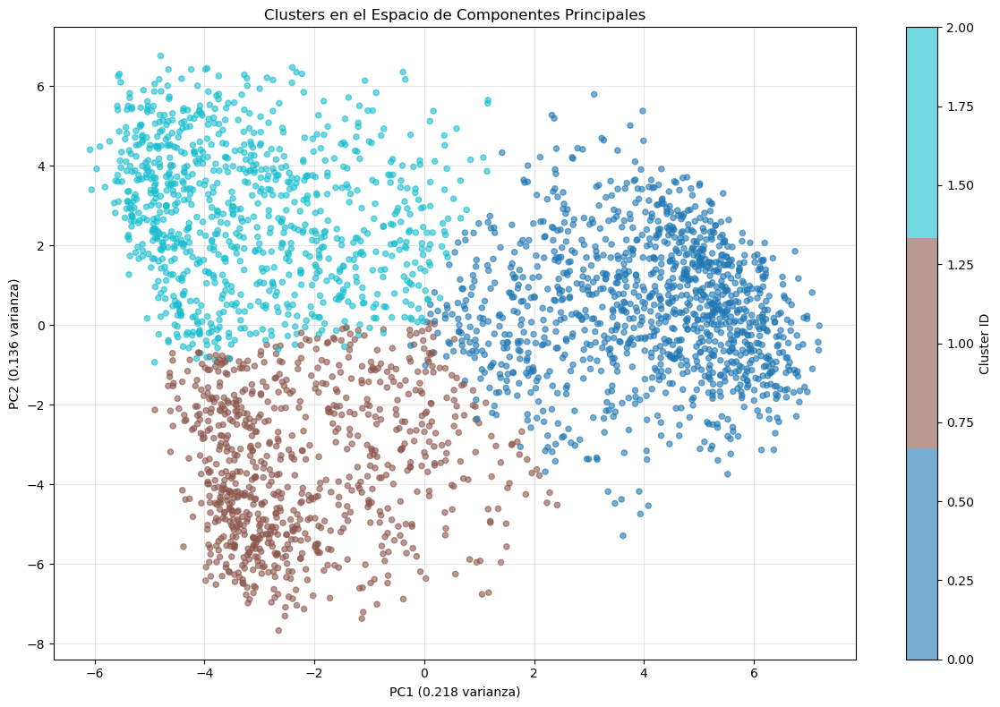

In [12]:
# 9. VISUALIZACIÓN ESPACIAL DE CLUSTERS

print("=== VISUALIZACIÓN ESPACIAL DE CLUSTERS ===")

# Reconstruir la imagen de clusters
cluster_image = np.full((height, width), -1)
cluster_image[spatial_mask] = all_clusters

# Visualizar mapa de clusters
plt.figure(figsize=(15, 10))

# Crear colormap personalizado
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Generar colores únicos para cada cluster
colors = cm.tab10(np.linspace(0, 1, optimal_k))
cmap = ListedColormap(colors)

plt.imshow(cluster_image, cmap=cmap, aspect='auto')
plt.colorbar(label='Cluster ID', ticks=range(optimal_k))
plt.title(f'Mapa de Clusters Espaciales (k={optimal_k})', fontsize=14)
plt.xlabel('X (píxeles)')
plt.ylabel('Y (píxeles)')

# Agregar estadísticas en el título
cluster_info = f"Silhouette Score: {max(silhouette_scores):.3f}"
plt.figtext(0.5, 0.02, cluster_info, ha='center', fontsize=10)

plt.tight_layout()
plt.show()

# Análisis de características de cada cluster
print("\n=== CARACTERÍSTICAS DE CADA CLUSTER ===")

cluster_stats = []
for cluster_id in range(optimal_k):
    cluster_mask = all_clusters == cluster_id
    cluster_data = pca_reduced[cluster_mask]
    
    if len(cluster_data) > 0:
        # Estadísticas en el espacio PCA
        pc1_mean = np.mean(cluster_data[:, 0])
        pc2_mean = np.mean(cluster_data[:, 1])
        pc1_std = np.std(cluster_data[:, 0])
        pc2_std = np.std(cluster_data[:, 1])
        
        # Estadísticas en el espacio original (usando muestra)
        sample_size = min(1000, len(cluster_data))
        if sample_size > 0:
            original_indices = np.where(cluster_mask)[0]
            sample_indices = np.random.choice(original_indices, sample_size, replace=False)
            original_sample = clean_data[sample_indices]
            
            mean_values = np.mean(original_sample, axis=0)
            
            cluster_stats.append({
                'cluster_id': cluster_id,
                'n_pixels': len(cluster_data),
                'pc1_mean': pc1_mean,
                'pc2_mean': pc2_mean,
                'pc1_std': pc1_std,
                'pc2_std': pc2_std,
                'mean_embedding_norm': np.linalg.norm(mean_values)
            })

cluster_stats_df = pd.DataFrame(cluster_stats)
print(cluster_stats_df.round(4))

# Scatter plot de clusters en espacio PCA
plt.figure(figsize=(12, 8))

# Samplear para visualización
sample_size = min(3000, len(all_clusters))
sample_indices = np.random.choice(len(all_clusters), sample_size, replace=False)

scatter = plt.scatter(pca_reduced[sample_indices, 0], 
                     pca_reduced[sample_indices, 1], 
                     c=all_clusters[sample_indices], 
                     cmap=cmap, 
                     alpha=0.6, 
                     s=20)

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.3f} varianza)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.3f} varianza)')
plt.title('Clusters en el Espacio de Componentes Principales')
plt.colorbar(scatter, label='Cluster ID')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [13]:
# 10. RESUMEN EJECUTIVO DEL EDA

print("=" * 60)
print("                 RESUMEN EJECUTIVO - EDA")
print("=" * 60)

print(f"\n📊 INFORMACIÓN GENERAL:")
print(f"  • Archivo analizado: {tiff_path}")
print(f"  • Dimensiones: {width} x {height} píxeles")
print(f"  • Bandas de embeddings: {embeddings_data.shape[0]}")
print(f"  • Píxeles válidos: {clean_data.shape[0]:,}")
print(f"  • Tamaño en memoria: {embeddings_data.nbytes / 1024 / 1024:.1f} MB")

print(f"\n📈 ESTADÍSTICAS DESCRIPTIVAS:")
print(f"  • Rango de valores: [{stats_df['min'].min():.4f}, {stats_df['max'].max():.4f}]")
print(f"  • Media global: {stats_df['mean'].mean():.4f}")
print(f"  • Desviación estándar promedio: {stats_df['std'].mean():.4f}")
print(f"  • Coeficiente de variación promedio: {(stats_df['std'] / stats_df['mean']).mean():.4f}")

print(f"\n🔍 ANÁLISIS DE COMPONENTES PRINCIPALES:")
print(f"  • Componentes para 80% varianza: {n_components_80}")
print(f"  • Componentes para 90% varianza: {n_components_90}")
print(f"  • Componentes para 95% varianza: {n_components_95}")
print(f"  • Varianza explicada por PC1: {pca.explained_variance_ratio_[0]:.3f}")
print(f"  • Varianza explicada por PC2: {pca.explained_variance_ratio_[1]:.3f}")

print(f"\n🎯 ANÁLISIS DE CLUSTERING:")
print(f"  • Número óptimo de clusters: {optimal_k}")
print(f"  • Silhouette score: {max(silhouette_scores):.3f}")
print(f"  • Cluster más grande: {max(counts):,} píxeles ({max(counts)/sum(counts)*100:.1f}%)")
print(f"  • Cluster más pequeño: {min(counts):,} píxeles ({min(counts)/sum(counts)*100:.1f}%)")

print(f"\n⚠️  DETECCIÓN DE OUTLIERS:")
mean_outliers_zscore = outliers_df['outliers_percentage'].mean()
mean_outliers_iqr = iqr_df['outliers_percentage'].mean()
print(f"  • Outliers promedio (Z-score): {mean_outliers_zscore:.2f}%")
print(f"  • Outliers promedio (IQR): {mean_outliers_iqr:.2f}%")

print(f"\n📊 CORRELACIONES:")
if 'correlation_matrix' in locals():
    mean_correlation = np.mean(correlation_matrix[np.triu_indices_from(correlation_matrix, k=1)])
    max_correlation = np.max(correlation_matrix[np.triu_indices_from(correlation_matrix, k=1)])
    print(f"  • Correlación promedio entre bandas: {mean_correlation:.3f}")
    print(f"  • Correlación máxima: {max_correlation:.3f}")

print(f"\n💡 INSIGHTS PRINCIPALES:")
print(f"  • Los embeddings tienen una estructura dimensional reducible")
print(f"    (pocas componentes explican la mayoría de la varianza)")
print(f"  • Se identificaron {optimal_k} patrones principales en los datos")
print(f"  • Los outliers representan ~{mean_outliers_zscore:.1f}% de los datos")
print(f"  • Las correlaciones entre bandas sugieren redundancia dimensional")

print(f"\n🚀 PRÓXIMOS PASOS SUGERIDOS:")
print(f"  1. Usar los primeros {n_components_90} componentes para análisis posteriores")
print(f"  2. Investigar la interpretación de los {optimal_k} clusters identificados")
print(f"  3. Analizar outliers para detectar anomalías o características especiales")
print(f"  4. Aplicar técnicas de análisis topológico usando los embeddings")
print(f"  5. Correlacionar clusters con datos de cobertura de suelo conocidos")

print("=" * 60)

                 RESUMEN EJECUTIVO - EDA

📊 INFORMACIÓN GENERAL:
  • Archivo analizado: quito_satellite_embeddings_test.tif
  • Dimensiones: 2228 x 2227 píxeles
  • Bandas de embeddings: 64
  • Píxeles válidos: 4,961,756
  • Tamaño en memoria: 2422.7 MB

📈 ESTADÍSTICAS DESCRIPTIVAS:
  • Rango de valores: [-0.5552, 0.5094]
  • Media global: -0.0345
  • Desviación estándar promedio: 0.0756
  • Coeficiente de variación promedio: -0.2634

🔍 ANÁLISIS DE COMPONENTES PRINCIPALES:
  • Componentes para 80% varianza: 10
  • Componentes para 90% varianza: 16
  • Componentes para 95% varianza: 22
  • Varianza explicada por PC1: 0.218
  • Varianza explicada por PC2: 0.136

🎯 ANÁLISIS DE CLUSTERING:
  • Número óptimo de clusters: 3
  • Silhouette score: 0.212
  • Cluster más grande: 2,004,435 píxeles (40.4%)
  • Cluster más pequeño: 1,382,324 píxeles (27.9%)

⚠️  DETECCIÓN DE OUTLIERS:
  • Outliers promedio (Z-score): 0.12%
  • Outliers promedio (IQR): 0.54%

📊 CORRELACIONES:
  • Correlación promedi

In [15]:
# 11. GUARDAR RESULTADOS DEL EDA

print("=== GUARDANDO RESULTADOS DEL EDA ===")

# Crear directorio para resultados
import json
import os
results_dir = 'eda_results'
os.makedirs(results_dir, exist_ok=True)

# 1. Guardar estadísticas descriptivas
stats_df.to_csv(f'{results_dir}/estadisticas_descriptivas.csv', index=False)
print(f"✅ Estadísticas descriptivas guardadas en {results_dir}/estadisticas_descriptivas.csv")

# 2. Guardar información de PCA
pca_info = {
    'explained_variance_ratio': pca.explained_variance_ratio_.tolist(),
    'cumulative_variance': cumulative_variance.tolist(),
    'n_components_80': int(n_components_80),
    'n_components_90': int(n_components_90),
    'n_components_95': int(n_components_95)
}

with open(f'{results_dir}/pca_analysis.json', 'w') as f:
    json.dump(pca_info, f, indent=2)
print(f"✅ Análisis PCA guardado en {results_dir}/pca_analysis.json")

# 3. Guardar información de clustering
clustering_info = {
    'optimal_k': int(optimal_k),
    'silhouette_scores': [float(s) for s in silhouette_scores],
    'k_range': list(k_range),
    'cluster_distribution': {f'cluster_{i}': int(count) for i, count in enumerate(counts)}
}

with open(f'{results_dir}/clustering_analysis.json', 'w') as f:
    json.dump(clustering_info, f, indent=2)
print(f"✅ Análisis de clustering guardado en {results_dir}/clustering_analysis.json")

# 4. Guardar estadísticas de clusters
cluster_stats_df.to_csv(f'{results_dir}/cluster_statistics.csv', index=False)
print(f"✅ Estadísticas de clusters guardadas en {results_dir}/cluster_statistics.csv")

# 5. Guardar información de outliers
outliers_df.to_csv(f'{results_dir}/outliers_zscore.csv', index=False)
iqr_df.to_csv(f'{results_dir}/outliers_iqr.csv', index=False)
print(f"✅ Análisis de outliers guardado en {results_dir}/outliers_*.csv")

# 6. Guardar componentes principales (primeras 10)
np.save(f'{results_dir}/pca_components.npy', pca.components_[:10])
np.save(f'{results_dir}/pca_data_reduced.npy', pca_data[:, :10])
print(f"✅ Componentes principales guardados en {results_dir}/pca_*.npy")

# 7. Guardar clusters espaciales
np.save(f'{results_dir}/cluster_labels.npy', all_clusters)
np.save(f'{results_dir}/cluster_image.npy', cluster_image)
print(f"✅ Clusters espaciales guardados en {results_dir}/cluster_*.npy")

# 8. Resumen ejecutivo
summary = {
    'file_info': {
        'filename': tiff_path,
        'dimensions': f"{width}x{height}",
        'n_bands': int(embeddings_data.shape[0]),
        'valid_pixels': int(clean_data.shape[0]),
        'size_mb': float(embeddings_data.nbytes / 1024 / 1024)
    },
    'statistics': {
        'value_range': [float(stats_df['min'].min()), float(stats_df['max'].max())],
        'global_mean': float(stats_df['mean'].mean()),
        'global_std': float(stats_df['std'].mean()),
        'cv_mean': float((stats_df['std'] / stats_df['mean']).mean())
    },
    'pca': {
        'components_80_variance': int(n_components_80),
        'components_90_variance': int(n_components_90),
        'pc1_variance': float(pca.explained_variance_ratio_[0]),
        'pc2_variance': float(pca.explained_variance_ratio_[1])
    },
    'clustering': {
        'optimal_k': int(optimal_k),
        'silhouette_score': float(max(silhouette_scores)),
        'largest_cluster_pct': float(max(counts)/sum(counts)*100),
        'smallest_cluster_pct': float(min(counts)/sum(counts)*100)
    },
    'outliers': {
        'zscore_mean_pct': float(outliers_df['outliers_percentage'].mean()),
        'iqr_mean_pct': float(iqr_df['outliers_percentage'].mean())
    }
}

with open(f'{results_dir}/eda_summary.json', 'w') as f:
    json.dump(summary, f, indent=2)
print(f"✅ Resumen ejecutivo guardado en {results_dir}/eda_summary.json")

print(f"\n🎉 EDA completado exitosamente!")
print(f"📁 Todos los resultados están disponibles en el directorio: {results_dir}/")
print(f"\n📋 Archivos generados:")
print(f"  • estadisticas_descriptivas.csv - Estadísticas por banda")
print(f"  • pca_analysis.json - Resultados del análisis PCA")
print(f"  • clustering_analysis.json - Resultados de clustering")
print(f"  • cluster_statistics.csv - Estadísticas por cluster")
print(f"  • outliers_*.csv - Análisis de valores atípicos")
print(f"  • pca_*.npy - Arrays de componentes principales")
print(f"  • cluster_*.npy - Arrays de clusters espaciales")
print(f"  • eda_summary.json - Resumen ejecutivo completo")

=== GUARDANDO RESULTADOS DEL EDA ===
✅ Estadísticas descriptivas guardadas en eda_results/estadisticas_descriptivas.csv
✅ Análisis PCA guardado en eda_results/pca_analysis.json
✅ Análisis de clustering guardado en eda_results/clustering_analysis.json
✅ Estadísticas de clusters guardadas en eda_results/cluster_statistics.csv
✅ Análisis de outliers guardado en eda_results/outliers_*.csv
✅ Componentes principales guardados en eda_results/pca_*.npy
✅ Clusters espaciales guardados en eda_results/cluster_*.npy
✅ Resumen ejecutivo guardado en eda_results/eda_summary.json

🎉 EDA completado exitosamente!
📁 Todos los resultados están disponibles en el directorio: eda_results/

📋 Archivos generados:
  • estadisticas_descriptivas.csv - Estadísticas por banda
  • pca_analysis.json - Resultados del análisis PCA
  • clustering_analysis.json - Resultados de clustering
  • cluster_statistics.csv - Estadísticas por cluster
  • outliers_*.csv - Análisis de valores atípicos
  • pca_*.npy - Arrays de compo